In [1]:
import os
import sys
import json
import numpy as np
import matplotlib.pyplot as plt

sys.path.insert(0, '../codes/')
import bulkMotion
import misc


font_size=26
plt.rcParams.update({'font.size': font_size})

# Read all the paths from the json file

The velocity files, DEM files, and the geoemtry files are all stored on `marmot-nobak`. These paths are stored in `datasets.json`.

We will:

1. Read the paths from the json file into a dictioanry for future use.
2. Make a backup of the json file

In [2]:
## Build a dictionary to save all the LOSgeom class obj from different datasets (tracks)
all_class = dict()


## Read pre-defined paths
my_json = '../inputs/datasets.json'
with open(my_json) as file:
    pathDict = json.load(file)
    
    
## Save pre-defined paths to a back-up
with open('../inputs/{}_bak.json'.format(my_json.split('.')[0]), 'w') as file:
    json_string = json.dumps(pathDict, default=lambda o: o.__dict__, sort_keys=True, indent=2)
    file.write(json_string)

# Plate motion model correction on the dataset

## Dataset: Australia descending track 046

+ Processing: already with ERA5, SET, ionosphere, demErr corrections applied

+ Make sure to use the plate motion model from papers, replace the `pmm` variable to reflect the plate motion model name

+ Use the corresponding plate name to plot the plate boundary geoemtry and arrows on it



----- 0.00 seconds ----- start timing

Analyze the data from:  Australia d046
prepare LOS geometry in geo-coordinates from file: /marmot-nobak/ykliu/australia/d046/mintpy/inputs/geometryGeo.h5
convert azimuth angle to heading angle
convert slantRangeDistance from meter to kilometer
Assume Euler Pole rotation for plate bulk motion
Input: omega_cartesian (wxyz)

Plate: Australia

Cartesian rotation vector:
 wx:            1.5100 mas / yr
 wy:            1.1820 mas / yr
 wz:            1.2150 mas / yr

Euler pole representation:
 Latitude:      32.3584 deg
 Longitude:     38.0532 deg
 Rotation rate: 0.6306 deg / Ma  

2D array locations

----- 23.25 seconds ----- got the model ENU velocity grid

Using pixel-wise ENU velocity input

----- 0.07 seconds ----- got the model LOS velocity grid



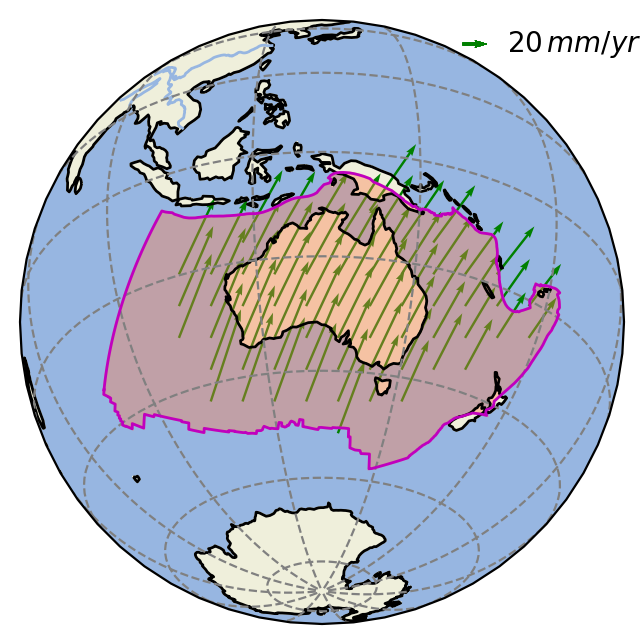

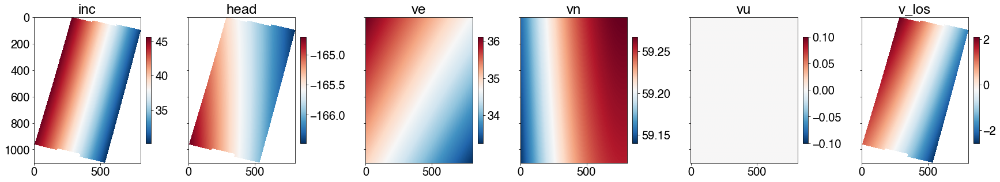

Min. LOS motion = -2.586
Max. LOS motion = 2.121
Dynamic range of LOS motion = 4.707
Use new reference point at lat/lon = -25.0 / 126.5
Reference data: <LOS velocity (no iono corr)> 	 shifted by -1.7204077243804932
Reference data: <LOS velocity (iono corr)> 	 shifted by -1.8384263515472412
Reference data: <LOS iono apparent velocity> 	 shifted by 0.10645846277475357
Reference data: <LOS Plate bulk motion> 	 shifted by 11.706144444880259

----- 4.18 seconds ----- applied correction on referenced data

Plot data no. 0: <LOS velocity (no iono corr)>
view.py /marmot-nobak/ykliu/australia/d046/mintpy/velocity_out/velocityIon.h5 velocity --fontsize 26 -u mm -v -5 5 --mask no --dem /marmot-nobak/ykliu/australia/dem/dem_resamp_d046/d046.dem --dem-nocontour -c RdBu_r --nocbar --alpha 0.78 --shade-exag 0.1 --shade-min -5000.0 --shade-max 5000.0 --lalo-step 2 --lalo-loc 1 0 0 1 --noscalebar --notitle --noverbose --coastline 10m --ref-lalo -25.0 126.5
Plot data no. 1: <LOS velocity (iono corr)>
vi

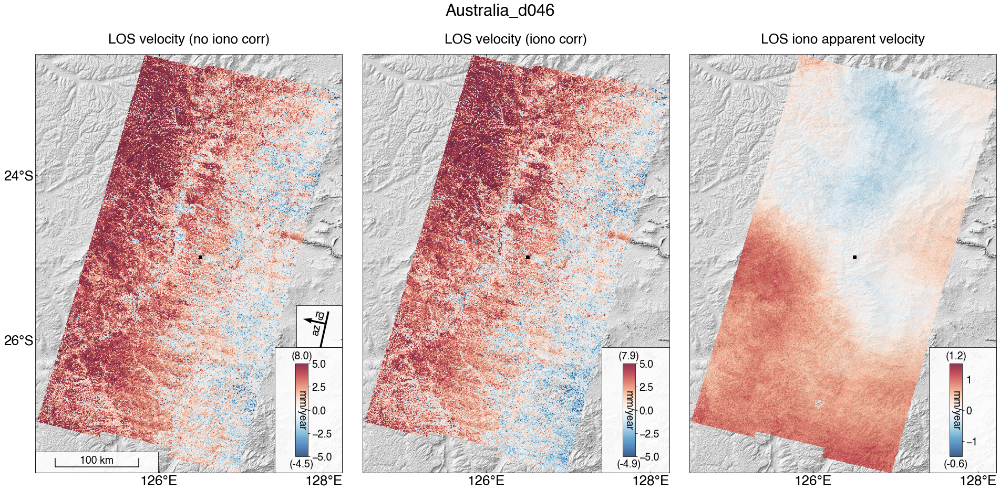


----- 43.55 seconds ----- plotted iono comparison

Range ramp scatter plot shifted by median 0.0
Ground range distance spans 250.3 km
Range ramp scatter plot shifted by median 8.881784197001252e-16
Ground range distance spans 253.3 km
Range ramp scatter plot shifted by median 0.0
Ground range distance spans 250.3 km
0.125 0.88
0.05416694 0.94756917
Save to file: ../pic/Australia_d046_rampfit.png


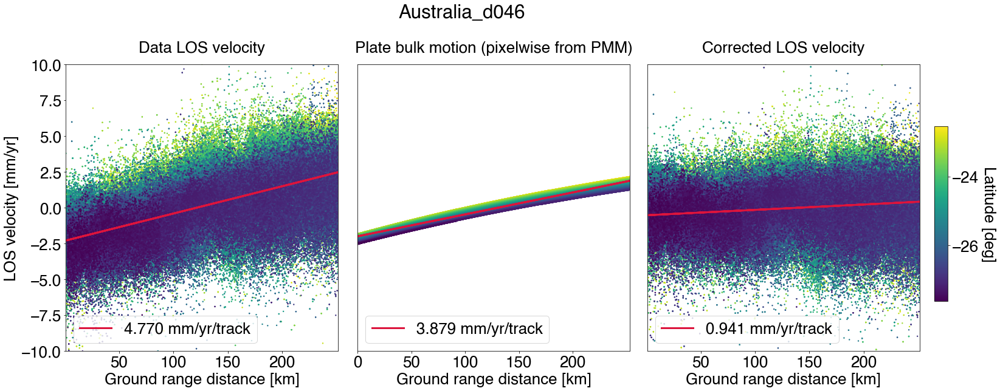


----- 59.38 seconds ----- plotted range ramps

only sohw one common colorbar in the first subplot
Plot data no. 0: <LOS velocity (iono corr)>
view.py /marmot-nobak/ykliu/australia/d046/mintpy/velocity_out/velocityIon.h5 velocity --fontsize 26 -u mm -v -5 5 --mask no --dem /marmot-nobak/ykliu/australia/dem/dem_resamp_d046/d046.dem --dem-nocontour -c RdBu_r --nocbar --alpha 0.78 --shade-exag 0.1 --shade-min -5000.0 --shade-max 5000.0 --lalo-step 2 --lalo-loc 1 0 0 1 --noscalebar --notitle --noverbose --coastline 10m --ref-lalo -25.0 126.5
Plot data no. 1: <LOS Plate bulk motion>
view.py /marmot-nobak/ykliu/australia/d046/mintpy/velocity_out/velocityIon.h5 velocity --fontsize 26 -u mm -v -5 5 --mask no --dem /marmot-nobak/ykliu/australia/dem/dem_resamp_d046/d046.dem --dem-nocontour -c RdBu_r --nocbar --alpha 0.78 --shade-exag 0.1 --shade-min -5000.0 --shade-max 5000.0 --lalo-step 2 --lalo-loc 1 0 0 1 --noscalebar --notitle --noverbose --coastline 10m --ref-lalo -25.0 126.5
Plot data no. 

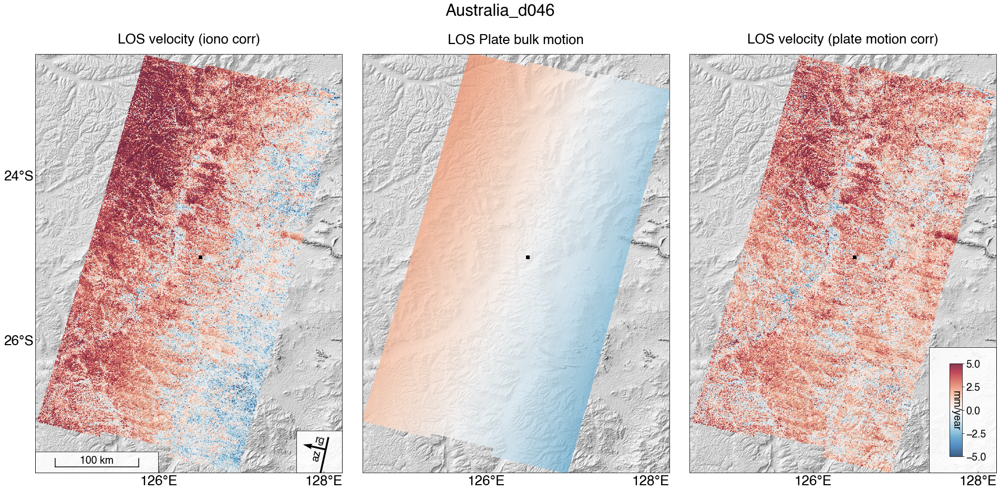


----- 43.31 seconds ----- plotted pmm correction


----- 0.34 seconds ----- saved .h5 files


===== 174.08 seconds ===== total time elapsed



In [3]:
omega_cart = [1.510, 1.182, 1.215]

dName = 'Australia d046'
pName = 'Australia'
pmm   = 'ITRF14'

kwargs = {  'pmm'          : pmm,
            'font_pmm'     : 12,
            'plot_pmm'     : True,
            'plot_ins'     : True,
            'plot_rmp'     : True,
            'plot_ion'     : True,
            'plot_maj'     : True,  
            'vlim_i'       : [[-5, 5],[-5,5],[-1.5,1.5]],
            'vlim_r'       : [-10,10],
            'vlim_b'       : [-5, 5],
            'refpoint'     : [-25., 126.5],
            'shadeExg'     : 0.1,
            'saveh5_dir'   : '../out_h5',
            'pic_dir'      : '../pic',
            'suffix'       : '',
            'cmap'         : 'RdBu_r',
            'dpi'          : 300,
            'wspace'       : 0.06,
            'laloStep'     : 2,
            'title_pad'    : 20
             }

all_class[dName] = bulkMotion.evaluate_bulkMotion(pathDict, dName, v_const=None, omega_cart=omega_cart, omega_sph=None, platename=pName, plateBound='MRVL', **kwargs)


----- 0.00 seconds ----- start timing

Analyze the data from:  Australia d119
prepare LOS geometry in geo-coordinates from file: /marmot-nobak/ykliu/australia/d119/mintpy/inputs/geometryGeo.h5
convert azimuth angle to heading angle
convert slantRangeDistance from meter to kilometer
Assume Euler Pole rotation for plate bulk motion
Input: omega_cartesian (wxyz)

Plate: Australia

Cartesian rotation vector:
 wx:            1.5100 mas / yr
 wy:            1.1820 mas / yr
 wz:            1.2150 mas / yr

Euler pole representation:
 Latitude:      32.3584 deg
 Longitude:     38.0532 deg
 Rotation rate: 0.6306 deg / Ma  

2D array locations

----- 25.77 seconds ----- got the model ENU velocity grid

Using pixel-wise ENU velocity input

----- 0.17 seconds ----- got the model LOS velocity grid



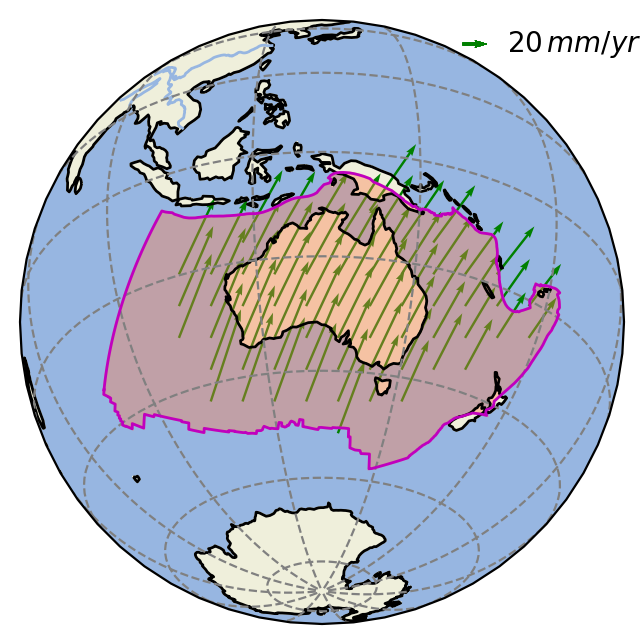

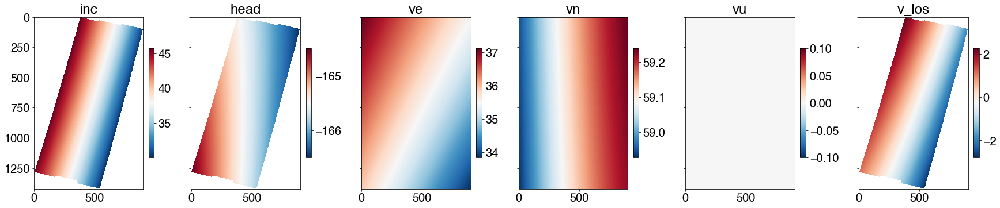

Min. LOS motion = -2.785
Max. LOS motion = 2.244
Dynamic range of LOS motion = 5.029
Use new reference point at lat/lon = -25.5 / 124.2
Reference data: <LOS velocity (no iono corr)> 	 shifted by 0.0
Reference data: <LOS velocity (iono corr)> 	 shifted by 0.0
Reference data: <LOS iono apparent velocity> 	 shifted by 0.0
Reference data: <LOS Plate bulk motion> 	 shifted by 12.334716577398888

----- 3.82 seconds ----- applied correction on referenced data

Plot data no. 0: <LOS velocity (no iono corr)>
view.py /marmot-nobak/ykliu/australia/d119/mintpy/velocity_out/velocity1.h5 velocity --fontsize 26 -u mm -v -5 5 --mask no --dem /marmot-nobak/ykliu/australia/dem/dem_resamp_d119/d119.dem --dem-nocontour -c RdBu_r --nocbar --alpha 0.78 --shade-exag 0.1 --shade-min -5000.0 --shade-max 5000.0 --lalo-step 2 --lalo-loc 1 0 0 1 --noscalebar --notitle --noverbose --coastline 10m --ref-lalo -25.5 124.2
Plot data no. 1: <LOS velocity (iono corr)>
view.py /marmot-nobak/ykliu/australia/d119/mintpy/ve

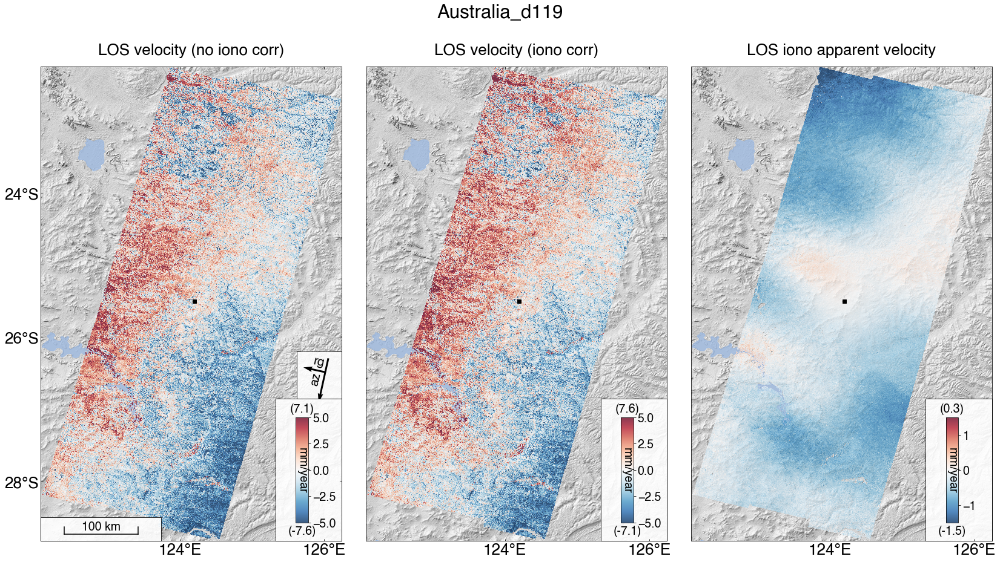


----- 36.67 seconds ----- plotted iono comparison

Range ramp scatter plot shifted by median 0.0
Ground range distance spans 251.0 km
Range ramp scatter plot shifted by median 8.881784197001252e-16
Ground range distance spans 253.3 km
Range ramp scatter plot shifted by median 0.0
Ground range distance spans 251.0 km
0.125 0.88
0.05416694 0.94756917
Save to file: ../pic/Australia_d119_rampfit.png


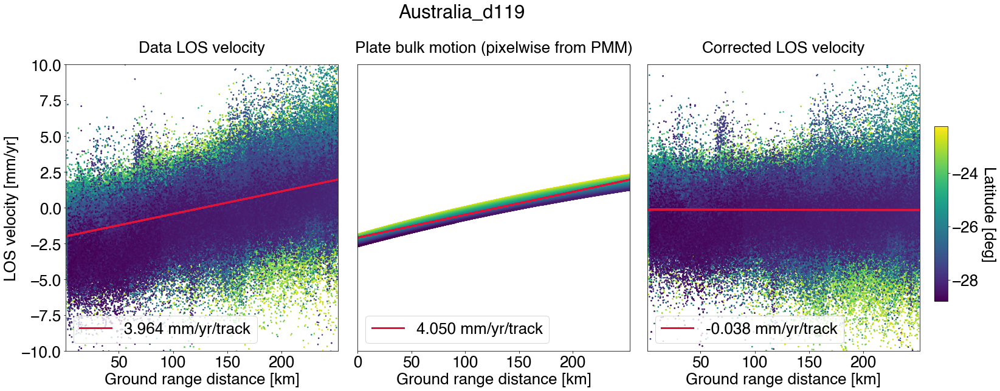


----- 64.84 seconds ----- plotted range ramps

only sohw one common colorbar in the first subplot
Plot data no. 0: <LOS velocity (iono corr)>
view.py /marmot-nobak/ykliu/australia/d119/mintpy/velocity_out/velocity1.h5 velocity --fontsize 26 -u mm -v -5 5 --mask no --dem /marmot-nobak/ykliu/australia/dem/dem_resamp_d119/d119.dem --dem-nocontour -c RdBu_r --nocbar --alpha 0.78 --shade-exag 0.1 --shade-min -5000.0 --shade-max 5000.0 --lalo-step 2 --lalo-loc 1 0 0 1 --noscalebar --notitle --noverbose --coastline 10m --ref-lalo -25.5 124.2
Plot data no. 1: <LOS Plate bulk motion>
view.py /marmot-nobak/ykliu/australia/d119/mintpy/velocity_out/velocity1.h5 velocity --fontsize 26 -u mm -v -5 5 --mask no --dem /marmot-nobak/ykliu/australia/dem/dem_resamp_d119/d119.dem --dem-nocontour -c RdBu_r --nocbar --alpha 0.78 --shade-exag 0.1 --shade-min -5000.0 --shade-max 5000.0 --lalo-step 2 --lalo-loc 1 0 0 1 --noscalebar --notitle --noverbose --coastline 10m --ref-lalo -25.5 124.2
Plot data no. 2: <

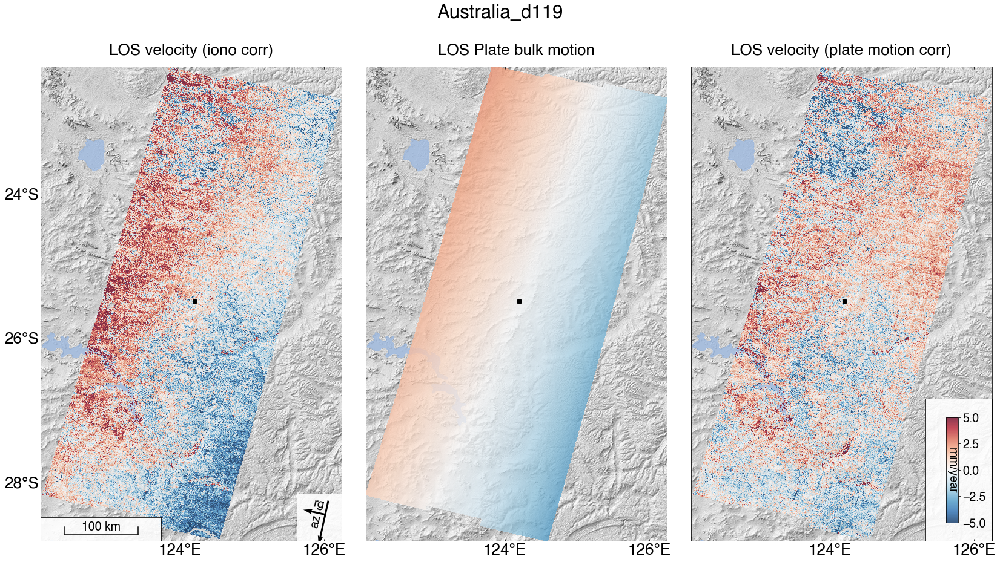


----- 31.13 seconds ----- plotted pmm correction


----- 0.17 seconds ----- saved .h5 files


===== 162.57 seconds ===== total time elapsed



In [5]:
omega_cart = [1.510, 1.182, 1.215]

dName = 'Australia d119'
pName = 'Australia'
pmm   = 'ITRF14'

kwargs = {  'pmm'          : pmm,
            'font_pmm'     : 12,
            'plot_pmm'     : True,
            'plot_ins'     : True,
            'plot_rmp'     : True,
            'plot_ion'     : True,
            'plot_maj'     : True,  
            'vlim_i'       : [[-5, 5],[-5,5],[-1.5,1.5]],
            'vlim_r'       : [-10,10],
            'vlim_b'       : [-5, 5],
            'refpoint'     : [-25.5, 124.2],
            'shadeExg'     : 0.1,
            'saveh5_dir'   : '../out_h5',
            'pic_dir'      : '../pic',
            'suffix'       : '',
            'cmap'         : 'RdBu_r',
            'dpi'          : 300,
            'wspace'       : 0.06,
            'laloStep'     : 2,
            'title_pad'    : 20
             }

all_class[dName] = bulkMotion.evaluate_bulkMotion(pathDict, dName, v_const=None, omega_cart=omega_cart, omega_sph=None, platename=pName, plateBound='MRVL', **kwargs)